In [2]:
#Only run it with CUDA on Google Colab!
#For first run, pls install lazypredict below!
# !pip install lazypredict

     |████████████████████████████████| 6.8 MB 15.3 MB/s 
     |████████████████████████████████| 14.5 MB 49.4 MB/s 
     |████████████████████████████████| 269 kB 59.8 MB/s 
     |████████████████████████████████| 248 kB 56.3 MB/s 
     |████████████████████████████████| 10.1 MB 47.7 MB/s 
     |████████████████████████████████| 1.2 MB 12.4 MB/s 
     |████████████████████████████████| 72 kB 587 kB/s 
     |████████████████████████████████| 127.6 MB 28 kB/s 
     |████████████████████████████████| 302 kB 62.9 MB/s 
     |████████████████████████████████| 25.9 MB 1.2 MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp37-cp37m-linux_x86_64.whl size=44636 sha256=7de44666f34fadd14be90e31cba6b4d5a50efd516d04e329ef7836d50bf48637
  Stored in directory: /root/.cache/pip/wheels/5e/03/1e/e1e954795d6f35dfc7b637fe2277bff021303bd9570ecea653
Successfully built PyYAML
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully 

In [1]:
#Load datatables
!pip install download
!pip install pytorch_tabnet

#Importing libraries
from download import download
from lazypredict.Supervised import LazyClassifier
from pytorch_tabnet.metrics import Metric
from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import copy
import json
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import torch


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.utils.testing module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.utils. Anything that cannot be imported from sklearn.utils is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
#Load data from dropbox
bedt_path = download("https://www.dropbox.com/s/8l115h004d6cd91/babushkin_et_dt.csv?dl=0","babushkin_et_dt.csv", replace=True)
ibmhdt_path = download("https://www.dropbox.com/s/npdsmt3uuiz6ab2/ibm_hra_dt.csv?dl=0","ibm_hra_dt.csv", replace=True)
hradt_path = download("https://www.dropbox.com/s/mo8e0n0wnmg1kzm/hra_dt.csv?dl=0","hra_dt.csv", replace=True)

#Load data into pandas dataframe
bedt_df = pd.read_csv("babushkin_et_dt.csv", sep=";")
ibmhdt_df = pd.read_csv("ibm_hra_dt.csv", sep=";")
hradt_df = pd.read_csv("hra_dt.csv", sep=";")

Successfully downloaded file to babushkin_et_dt.csv
Successfully downloaded file to ibm_hra_dt.csv
Successfully downloaded file to hra_dt.csv


#Babushkin et dt

In [ ]:
#View the data
bedt_df.head()

,stag,gender,age,industry,profession,traffic,coach,head_gender,greywage,way,extraversion,independ,selfcontrol,anxiety,novator,event
0,7.03,m,35.00,Banks,HR,rabrecNErab,no,f,white,bus,6.20,4.10,5.70,7.10,8.30,1
1,22.97,m,33.00,Banks,HR,empjs,no,m,white,bus,6.20,4.10,5.70,7.10,8.30,1
2,15.93,f,35.00,PowerGeneration,HR,rabrecNErab,no,m,white,bus,6.20,6.20,2.60,4.80,8.30,1
3,15.93,f,35.00,PowerGeneration,HR,rabrecNErab,no,m,white,bus,5.40,7.60,4.90,2.50,6.70,1
4,8.41,m,32.00,Retail,Commercial,youjs,yes,f,white,bus,3.00,4.10,8.00,7.10,3.70,1


In [ ]:
#Checking datatypes
bedt_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1116 entries, 0 to 1115
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   stag          1116 non-null   float64
 1   gender        1116 non-null   object 
 2   age           1116 non-null   float64
 3   industry      1116 non-null   object 
 4   profession    1116 non-null   object 
 5   traffic       1116 non-null   object 
 6   coach         1116 non-null   object 
 7   head_gender   1116 non-null   object 
 8   greywage      1116 non-null   object 
 9   way           1116 non-null   object 
 10  extraversion  1116 non-null   float64
 11  independ      1116 non-null   float64
 12  selfcontrol   1116 non-null   float64
 13  anxiety       1116 non-null   float64
 14  novator       1116 non-null   float64
 15  event         1116 non-null   int64  
dtypes: float64(7), int64(1), object(8)
memory usage: 139.6+ KB


In [ ]:
#Checking descriptive statistics
bedt_df.describe()

,stag,age,extraversion,independ,selfcontrol,anxiety,novator,event
count,1116.00,1116.00,1116.00,1116.00,1116.00,1116.00,1116.00,1116.00
mean,36.70,31.02,5.59,5.47,5.61,5.67,5.88,0.50
std,34.17,6.97,1.86,1.70,1.99,1.71,1.90,0.50
min,0.39,18.00,1.00,1.00,1.00,1.70,1.00,0.00
25%,11.72,26.00,4.60,4.10,4.10,4.80,4.40,0.00
50%,24.44,30.00,5.40,5.50,5.70,5.60,6.00,1.00
75%,51.62,36.00,7.00,6.90,7.20,7.10,7.50,1.00
max,179.45,58.00,10.00,10.00,10.00,10.00,10.00,1.00


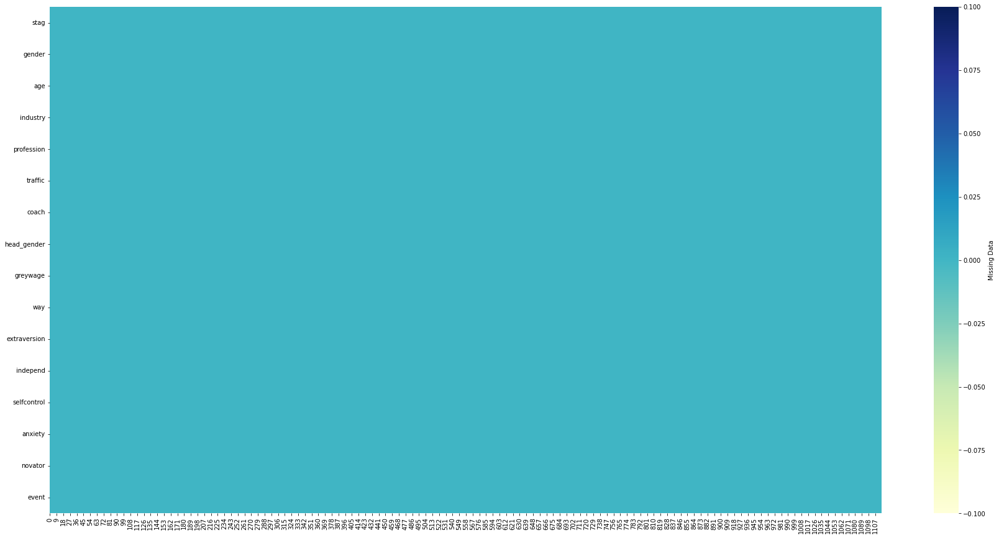

In [ ]:
#Checking missing values
plt.figure(figsize=(30,15))
sns.heatmap(bedt_df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

In [ ]:
#Missing data imputation - Not needed here (see above MD graph -> 0 missing data)

In [3]:
#Separating differently encoded variables
float_features_b = bedt_df.loc[:, ["stag", "age", "extraversion","independ","selfcontrol", "anxiety", "novator"]] #float
dummy_features_b = bedt_df.loc[:, ["gender", "head_gender", "greywage", "way", "coach", "traffic", "industry", "profession"]] #dummy
target_variable_b = bedt_df.loc[:, ["event"]] #target variable
target_variable_b = target_variable_b.replace({"event": {1: 0, 0: 1}})

In [4]:
#Encoding features
dummy_features_b = pd.concat([pd.get_dummies(dummy_features_b['gender'], prefix='gender').iloc[:,0], 
                              pd.get_dummies(dummy_features_b['head_gender'], prefix='head_gender').iloc[:,0], 
                              pd.get_dummies(dummy_features_b['greywage'], prefix='greywage').iloc[:,0], 
                              pd.get_dummies(dummy_features_b['way'], prefix='way').iloc[:,0:2], 
                              pd.get_dummies(dummy_features_b['coach'], prefix='coach').iloc[:,0:2], 
                              pd.get_dummies(dummy_features_b['traffic'], prefix='traffic').iloc[:,0:7], 
                              pd.get_dummies(dummy_features_b['industry'], prefix='industry').iloc[:,0:15], 
                              pd.get_dummies(dummy_features_b['profession'], prefix='profession').iloc[:,0:14]], axis=1)

In [5]:
#Concat all subdfs into 1
concated_df_b = pd.concat([float_features_b, dummy_features_b, target_variable_b], axis=1)

In [ ]:
#Checking data distributions

sns.pairplot(concated_df_b)

In [ ]:
#Target imbalance description:
concated_df_b["event"].value_counts()/concated_df_b["event"].count()

0   0.50
1   0.50
Name: event, dtype: float64

Text(0.5, 1.0, 'Correlation Heatmap of B')

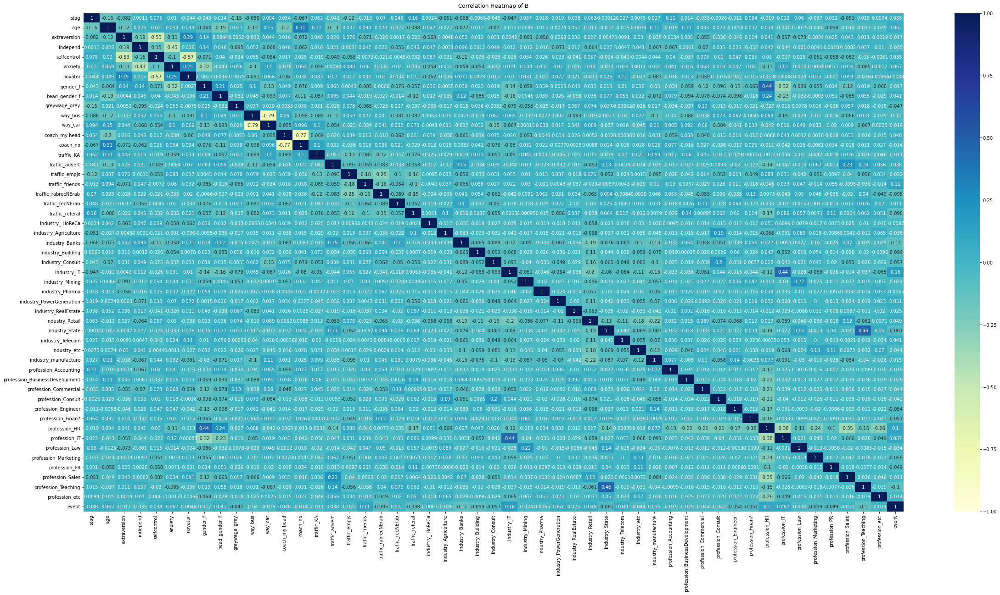

In [ ]:
#Checking correlation of data
#Source: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

plt.figure(figsize=(40, 20))

heatmap_b = sns.heatmap(concated_df_b.corr(method='spearman'), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

heatmap_b.set_title('Correlation Heatmap of B', fontdict={'fontsize':12}, pad=12)

In [6]:
#Log scaling not normal feature data distributions

concated_df_b.loc[:,["stag", "age"]]+=1
concated_log_df_b = np.log(concated_df_b.loc[:,["stag", "age"]])
concated_df_b = concated_df_b.drop(["stag", "age"], axis = 1)

In [7]:
#Splitting data and Standardizing features

concated_df_b = pd.concat([concated_log_df_b, concated_df_b], axis=1)
X_b = concated_df_b.iloc[:,:-1]
y_b = concated_df_b.iloc[:,-1]

X_train_b, X_valid_b, y_train_b, y_valid_b = train_test_split(X_b, y_b, test_size=0.33, random_state=0)

In [ ]:
#Preparing data for lazyprediction - (0.33 valid and 0.67 train)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_b, X_valid_b, y_train_b, y_valid_b)

print(models)

100%|██████████| 29/29 [00:02<00:00, 10.13it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
ExtraTreesClassifier               0.72               0.72     0.72      0.72   
RandomForestClassifier             0.71               0.72     0.72      0.71   
XGBClassifier                      0.70               0.70     0.70      0.70   
LGBMClassifier                     0.69               0.69     0.69      0.69   
LabelSpreading                     0.68               0.68     0.68      0.68   
LabelPropagation                   0.68               0.68     0.68      0.68   
BaggingClassifier                  0.66               0.67     0.67      0.66   
LinearSVC                          0.66               0.66     0.66      0.66   
NuSVC                              0.66               0.66     0.66      0.66   
LinearDiscriminantAnalysis         0.66               0.66     0.66      0.66   
RidgeClassifier             

In [8]:
###Setting seed

np.random.seed(0)

In [9]:
###Training the model for clf (Tabnet) object
#Source: https://github.com/dreamquark-ai/tabnet

class F1_score(Metric):
    def __init__(self):
        self._name = "f1_score"
        self._maximize = True

    def __call__(self, y_true, y_score):
        y_score = np.where(y_score > 0.5, 1, 0)
        y_score = y_score[:,1]
        return f1_score(y_true, y_score, average="weighted")

n_total_train = len(X_b)

train_indices, valid_indices = train_test_split(range(n_total_train), test_size=0.33, random_state=0)


clf = TabNetClassifier(
    n_d=64, n_a=64, n_steps=5,
    gamma=1.5, n_independent=2, n_shared=2,
    cat_emb_dim=1,
    lambda_sparse=1e-4, momentum=0.3, clip_value=2.,
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    scheduler_params = {"gamma": 0.95,
                     "step_size": 20},
    scheduler_fn=torch.optim.lr_scheduler.StepLR, epsilon=1e-15
)

X_train_b_tb = X_b.values[train_indices]
y_train_b_tb = y_b.values[train_indices]

X_valid_b_tb = X_b.values[valid_indices]
y_valid_b_tb = y_b.values[valid_indices]

sc = StandardScaler()
X_train_b_tb = sc.fit_transform(X_train_b_tb)
X_valid_b_tb = sc.transform(X_valid_b_tb)

max_epochs = 100

clf.fit(
    X_train=X_train_b_tb, y_train=y_train_b_tb,
    eval_set=[(X_train_b_tb, y_train_b_tb), (X_valid_b_tb, y_valid_b_tb)],
    eval_name=['train', 'valid'],
    eval_metric=[F1_score],
    max_epochs=max_epochs, patience=100,
    batch_size=64, virtual_batch_size=64
)

Device used : cuda
epoch 0  | loss: 1.27474 | train_f1_score: 0.48689 | valid_f1_score: 0.42831 |  0:00:00s
epoch 1  | loss: 0.96342 | train_f1_score: 0.55056 | valid_f1_score: 0.54734 |  0:00:01s
epoch 2  | loss: 0.812   | train_f1_score: 0.39283 | valid_f1_score: 0.36084 |  0:00:01s
epoch 3  | loss: 0.90254 | train_f1_score: 0.46139 | valid_f1_score: 0.38015 |  0:00:02s
epoch 4  | loss: 0.73515 | train_f1_score: 0.51661 | valid_f1_score: 0.48252 |  0:00:03s
epoch 5  | loss: 0.69494 | train_f1_score: 0.53858 | valid_f1_score: 0.517   |  0:00:03s
epoch 6  | loss: 0.70114 | train_f1_score: 0.5557  | valid_f1_score: 0.58318 |  0:00:04s
epoch 7  | loss: 0.70148 | train_f1_score: 0.58812 | valid_f1_score: 0.49692 |  0:00:04s
epoch 8  | loss: 0.70873 | train_f1_score: 0.5312  | valid_f1_score: 0.50912 |  0:00:05s
epoch 9  | loss: 0.70568 | train_f1_score: 0.54194 | valid_f1_score: 0.48964 |  0:00:05s
epoch 10 | loss: 0.69699 | train_f1_score: 0.53394 | valid_f1_score: 0.43581 |  0:00:06s
ep

#IBM HRA dt

In [ ]:
#View the data
ibmhdt_df.head()

,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition
0,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,...,1,0,8,0,1,6,4,0,5,Yes
1,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,...,4,1,10,3,3,10,7,1,7,No
2,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,...,2,0,7,3,3,0,0,0,0,Yes
3,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,...,3,0,8,3,3,8,7,3,0,No
4,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,...,4,1,6,3,3,2,2,2,2,No


In [ ]:
#Checking datatypes
ibmhdt_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   BusinessTravel            1470 non-null   object
 2   DailyRate                 1470 non-null   int64 
 3   Department                1470 non-null   object
 4   DistanceFromHome          1470 non-null   int64 
 5   Education                 1470 non-null   int64 
 6   EducationField            1470 non-null   object
 7   EnvironmentSatisfaction   1470 non-null   int64 
 8   Gender                    1470 non-null   object
 9   HourlyRate                1470 non-null   int64 
 10  JobInvolvement            1470 non-null   int64 
 11  JobLevel                  1470 non-null   int64 
 12  JobRole                   1470 non-null   object
 13  JobSatisfaction           1470 non-null   int64 
 14  MaritalStatus           

In [ ]:
#Checking descriptive statistics
ibmhdt_df.describe()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,...,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00
mean,36.92,802.49,9.19,2.91,2.72,65.89,2.73,2.06,2.73,6502.93,...,3.15,2.71,0.79,11.28,2.80,2.76,7.01,4.23,2.19,4.12
std,9.14,403.51,8.11,1.02,1.09,20.33,0.71,1.11,1.10,4707.96,...,0.36,1.08,0.85,7.78,1.29,0.71,6.13,3.62,3.22,3.57
min,18.00,102.00,1.00,1.00,1.00,30.00,1.00,1.00,1.00,1009.00,...,3.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,30.00,465.00,2.00,2.00,2.00,48.00,2.00,1.00,2.00,2911.00,...,3.00,2.00,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,36.00,802.00,7.00,3.00,3.00,66.00,3.00,2.00,3.00,4919.00,...,3.00,3.00,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,43.00,1157.00,14.00,4.00,4.00,83.75,3.00,3.00,4.00,8379.00,...,3.00,4.00,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,60.00,1499.00,29.00,5.00,4.00,100.00,4.00,5.00,4.00,19999.00,...,4.00,4.00,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


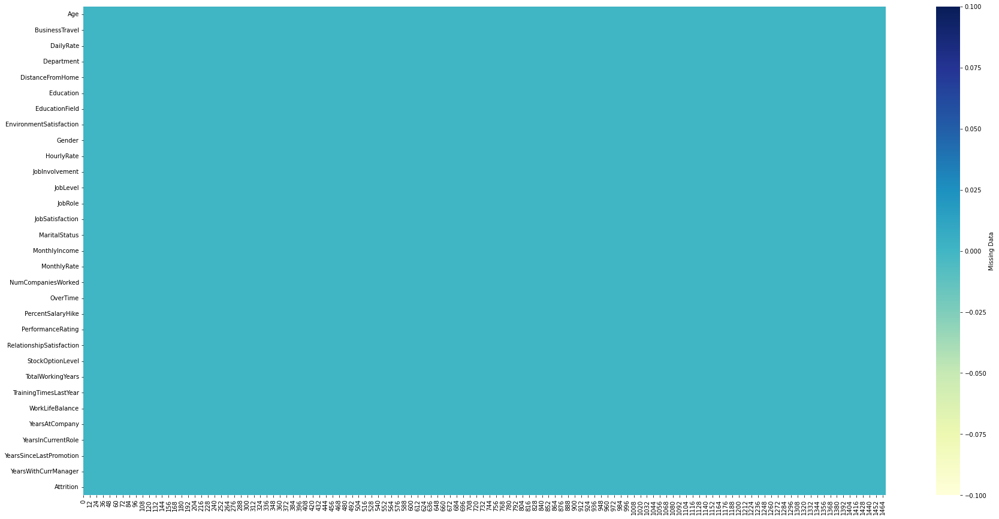

In [ ]:
#Checking missing values
plt.figure(figsize=(30,15))
sns.heatmap(ibmhdt_df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

In [ ]:
#Missing data imputation - Not needed here (see above MD graph -> 0 missing data)

In [ ]:
#Separating differently encoded variables
float_features_i = ibmhdt_df.loc[:, ["Age","DailyRate","DistanceFromHome","Education","EnvironmentSatisfaction","HourlyRate","JobInvolvement","JobLevel","JobSatisfaction","MonthlyIncome","MonthlyRate","NumCompaniesWorked","PercentSalaryHike","RelationshipSatisfaction","StockOptionLevel","TotalWorkingYears","TrainingTimesLastYear","WorkLifeBalance","YearsAtCompany","YearsInCurrentRole","YearsSinceLastPromotion","YearsWithCurrManager"]] #int
dummy_features_i = ibmhdt_df.loc[:, ["Gender","OverTime","PerformanceRating","Attrition","Department","EducationField","JobRole", "BusinessTravel","MaritalStatus"]] #dummy

In [ ]:
#Encoding features
dummy_features_i = pd.concat([pd.get_dummies(dummy_features_i['Gender'], prefix='Gender').iloc[:,0],
                              pd.get_dummies(dummy_features_i['OverTime'], prefix='OverTime').iloc[:,0],
                              pd.get_dummies(dummy_features_i['PerformanceRating'], prefix='PerformanceRating').iloc[:,0],
                              pd.get_dummies(dummy_features_i['Attrition'], prefix='Attrition').iloc[:,0],
                              pd.get_dummies(dummy_features_i['Department'], prefix='Department').iloc[:,0:2],
                              pd.get_dummies(dummy_features_i['EducationField'], prefix='EducationField').iloc[:,0:5],
                              pd.get_dummies(dummy_features_i['JobRole'], prefix='JobRole').iloc[:,0:8],
                              pd.get_dummies(dummy_features_i['BusinessTravel'], prefix='BusinessTravel').iloc[:,0:2],
                              pd.get_dummies(dummy_features_i['MaritalStatus'], prefix='MaritalStatus').iloc[:,0:2]], axis=1)

In [ ]:
#Concat all subdfs into 1
concated_df_i = pd.concat([float_features_i, dummy_features_i], axis=1)

In [ ]:
#List names of variables
concated_df_i.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Gender_Female', 'OverTime_No',
       'PerformanceRating_3', 'Attrition_No', 'Department_Human Resources',
       'Department_Research & Development', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'JobRole_Healthcare Representative', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Res

In [ ]:
#Renaming variables
concated_df_i = concated_df_i.loc[:,['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'RelationshipSatisfaction', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'Gender_Female', 'OverTime_No',
       'PerformanceRating_3', 'Department_Human Resources',
       'Department_Research & Development', 'EducationField_Human Resources',
       'EducationField_Life Sciences', 'EducationField_Marketing',
       'EducationField_Medical', 'EducationField_Other',
       'JobRole_Healthcare Representative', 'JobRole_Human Resources',
       'JobRole_Laboratory Technician', 'JobRole_Manager',
       'JobRole_Manufacturing Director', 'JobRole_Research Director',
       'JobRole_Research Scientist', 'JobRole_Sales Executive',
       'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently',
       'MaritalStatus_Divorced', 'MaritalStatus_Married', 'Attrition_No']]

In [ ]:
#Checking data distributions

sns.pairplot(concated_df_i)

In [ ]:
#Target imbalance description:
concated_df_i["Attrition_No"].value_counts()/concated_df_i["Attrition_No"].count()

1   0.84
0   0.16
Name: Attrition_No, dtype: float64

Text(0.5, 1.0, 'Correlation Heatmap of I')

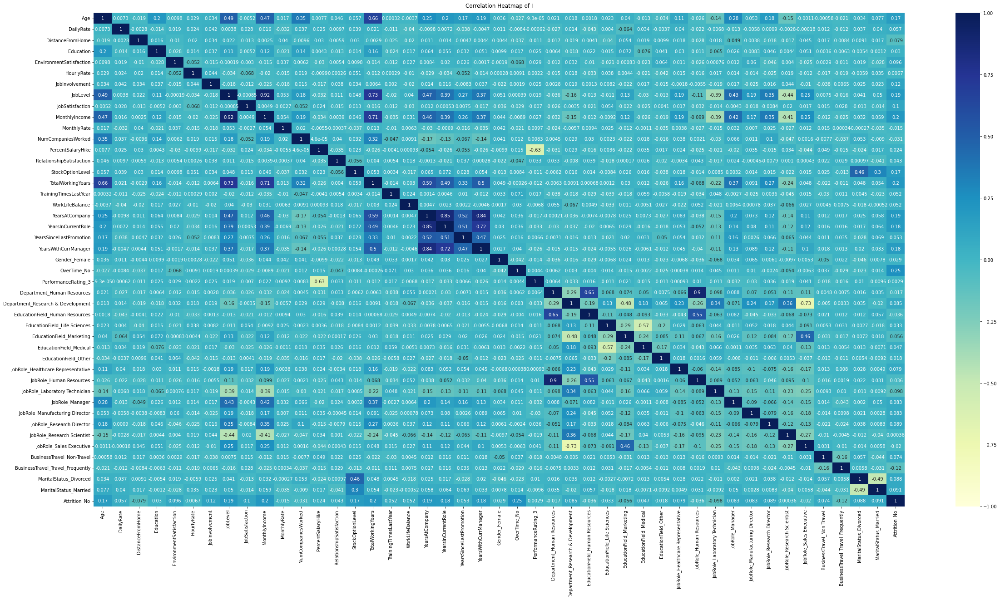

In [ ]:
#Checking correlation of data
#Source: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

plt.figure(figsize=(40, 20))

heatmap_i = sns.heatmap(concated_df_i.corr(method='spearman'), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

heatmap_i.set_title('Correlation Heatmap of I', fontdict={'fontsize':12}, pad=12)

In [ ]:
#Log scaling not normal feature data distributions

concated_df_i.loc[:,["Age", "DailyRate", "DistanceFromHome", "Education", "HourlyRate", "JobInvolvement", "JobLevel", "JobSatisfaction", "MonthlyIncome", "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", "RelationshipSatisfaction", "StockOptionLevel", "TotalWorkingYears", "WorkLifeBalance", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager"]]+=1
concated_log_df_i = np.log(concated_df_i.loc[:,["Age", "DailyRate", "DistanceFromHome", "Education", "HourlyRate", "JobInvolvement", "JobLevel", "JobSatisfaction", "MonthlyIncome", "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", "RelationshipSatisfaction", "StockOptionLevel", "TotalWorkingYears", "WorkLifeBalance", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager"]])
concated_df_i = concated_df_i.drop(["Age", "DailyRate", "DistanceFromHome", "Education", "HourlyRate", "JobInvolvement", "JobLevel", "JobSatisfaction", "MonthlyIncome", "MonthlyRate", "NumCompaniesWorked", "PercentSalaryHike", "RelationshipSatisfaction", "StockOptionLevel", "TotalWorkingYears", "WorkLifeBalance", "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", "YearsWithCurrManager"], axis = 1)

In [ ]:
#Splitting data and Standardizing features

concated_df_i = pd.concat([concated_log_df_i, concated_df_i], axis=1)
X_i = concated_df_i.iloc[:,:-1]
y_i = concated_df_i.iloc[:,-1]

X_train_i, X_valid_i, y_train_i, y_valid_i = train_test_split(X_i, y_i, test_size=0.33, random_state=0)

In [ ]:
#Preparing data for lazyprediction - (0.33 valid and 0.67 train)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_i, X_valid_i, y_train_i, y_valid_i)

print(models)

100%|██████████| 29/29 [00:02<00:00, 10.34it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
SGDClassifier                      0.84               0.74     0.74      0.85   
LogisticRegression                 0.90               0.73     0.73      0.89   
NearestCentroid                    0.72               0.72     0.72      0.75   
Perceptron                         0.84               0.71     0.71      0.84   
LinearDiscriminantAnalysis         0.89               0.71     0.71      0.87   
PassiveAggressiveClassifier        0.82               0.70     0.70      0.82   
GaussianNB                         0.69               0.70     0.70      0.73   
LinearSVC                          0.89               0.70     0.70      0.87   
BernoulliNB                        0.78               0.67     0.67      0.80   
AdaBoostClassifier                 0.87               0.67     0.67      0.85   
CalibratedClassifierCV      

In [ ]:
###Setting seed

np.random.seed(0)

In [ ]:
###Training the model for clf (Tabnet) object

class F1_score(Metric):
    def __init__(self):
        self._name = "f1_score"
        self._maximize = True

    def __call__(self, y_true, y_score):
        y_score = np.where(y_score > 0.5, 1, 0)
        y_score = y_score[:,1]
        return f1_score(y_true, y_score, average="weighted")

n_total_train = len(X_i)

train_indices_i_tb, valid_indices_i_tb = train_test_split(range(n_total_train), test_size=0.33, random_state=0)


clf = TabNetClassifier(
    n_d=64, n_a=64, n_steps=5,
    gamma=1.5, n_independent=2, n_shared=2,
    cat_emb_dim=1,
    lambda_sparse=1e-4, momentum=0.3, clip_value=2.,
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    scheduler_params = {"gamma": 0.95,
                     "step_size": 20},
    scheduler_fn=torch.optim.lr_scheduler.StepLR, epsilon=1e-15
)

X_train_i_tb = X_i.values[train_indices_i_tb]
y_train_i_tb = y_i.values[train_indices_i_tb]

X_valid_i_tb = X_i.values[valid_indices_i_tb]
y_valid_i_tb = y_i.values[valid_indices_i_tb]

sc = StandardScaler()
X_train_i_tb = sc.fit_transform(X_train_i_tb)
X_valid_i_tb = sc.transform(X_valid_i_tb)

max_epochs = 100

clf.fit(
    X_train=X_train_i_tb, y_train=y_train_i_tb,
    eval_set=[(X_train_i_tb, y_train_i_tb), (X_valid_i_tb, y_valid_i_tb)],
    eval_name=['train', 'valid'],
    eval_metric=[F1_score],
    max_epochs=max_epochs, patience=100,
    batch_size=64, virtual_batch_size=64
)

Device used : cuda
epoch 0  | loss: 0.98831 | train_f1_score: 0.77337 | valid_f1_score: 0.76991 |  0:00:01s
epoch 1  | loss: 0.66118 | train_f1_score: 0.78727 | valid_f1_score: 0.76461 |  0:00:02s
epoch 2  | loss: 0.50595 | train_f1_score: 0.78152 | valid_f1_score: 0.77585 |  0:00:03s
epoch 3  | loss: 0.48941 | train_f1_score: 0.77412 | valid_f1_score: 0.77198 |  0:00:04s
epoch 4  | loss: 0.48397 | train_f1_score: 0.78924 | valid_f1_score: 0.79474 |  0:00:05s
epoch 5  | loss: 0.45876 | train_f1_score: 0.78488 | valid_f1_score: 0.79189 |  0:00:06s
epoch 6  | loss: 0.43356 | train_f1_score: 0.78991 | valid_f1_score: 0.78796 |  0:00:07s
epoch 7  | loss: 0.41572 | train_f1_score: 0.78917 | valid_f1_score: 0.77955 |  0:00:08s
epoch 8  | loss: 0.44378 | train_f1_score: 0.80849 | valid_f1_score: 0.79535 |  0:00:09s
epoch 9  | loss: 0.42687 | train_f1_score: 0.80298 | valid_f1_score: 0.7969  |  0:00:10s
epoch 10 | loss: 0.40637 | train_f1_score: 0.82807 | valid_f1_score: 0.80642 |  0:00:11s
ep

#HRA dt

In [ ]:
#View the data
hradt_df.head()

,city,city_development_index,gender,relevant_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,city_103,0.92,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,1,36,1
1,city_40,0.78,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0
2,city_21,0.62,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,never,83,0
3,city_115,0.79,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,never,52,1
4,city_162,0.77,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0


In [ ]:
#Checking datatypes
hradt_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   city                    19158 non-null  object 
 1   city_development_index  19158 non-null  float64
 2   gender                  14650 non-null  object 
 3   relevant_experience     19158 non-null  object 
 4   enrolled_university     18772 non-null  object 
 5   education_level         18698 non-null  object 
 6   major_discipline        16345 non-null  object 
 7   experience              19093 non-null  object 
 8   company_size            13220 non-null  object 
 9   company_type            13018 non-null  object 
 10  last_new_job            18735 non-null  object 
 11  training_hours          19158 non-null  int64  
 12  target                  19158 non-null  int64  
dtypes: float64(1), int64(2), object(10)
memory usage: 1.9+ MB


In [ ]:
#Checking descriptive statistics
hradt_df.describe()

,city_development_index,training_hours,target
count,19158.00,19158.00,19158.00
mean,0.83,65.37,0.25
std,0.12,60.06,0.43
min,0.45,1.00,0.00
25%,0.74,23.00,0.00
50%,0.90,47.00,0.00
75%,0.92,88.00,0.00
max,0.95,336.00,1.00


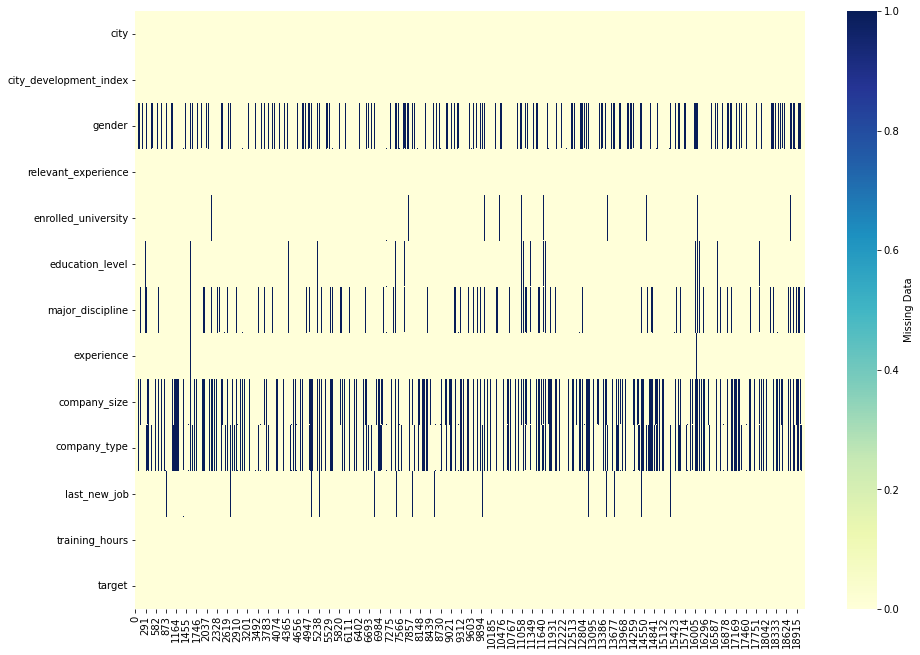

In [ ]:
#Checking missing values
plt.figure(figsize=(15,11))
sns.heatmap(hradt_df.isna().transpose(),
            cmap="YlGnBu",
            cbar_kws={'label': 'Missing Data'})

In [ ]:
#Ratio of Missing Data per features
hradt_df.isna().sum()/len(hradt_df)*100

city                      0.00
city_development_index    0.00
gender                   23.53
relevant_experience       0.00
enrolled_university       2.01
education_level           2.40
major_discipline         14.68
experience                0.34
company_size             30.99
company_type             32.05
last_new_job              2.21
training_hours            0.00
target                    0.00
dtype: float64

In [ ]:
#Separating differently encoded variables
float_features_h = hradt_df.loc[:, ["city_development_index", "training_hours"]] #numeric
dummy_features_h = hradt_df.loc[:, ["relevant_experience","city"]] #dummy
label_features_h = hradt_df.loc[:, ["enrolled_university", "education_level", "major_discipline", "experience", "company_size", "company_type", "last_new_job", "gender"]]
target_variable_h = hradt_df.loc[:, ["target"]] #target variable
target_variable_h = target_variable_h.replace({"target": {1: 0, 0: 1}})

In [ ]:
#LabelEncoder with memory
#Source: https://python.tutorialink.com/how-to-reverse-label-encoder-from-sklearn-for-multiple-columns/
class MultiColumnLabelEncoder:

    def __init__(self, columns=None):
        self.columns = columns # array of column names to encode


    def fit(self, X, y=None):
        from sklearn.preprocessing import LabelEncoder
        self.encoders = {}
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            self.encoders[col] = LabelEncoder().fit(X[col])
        return self


    def transform(self, X):
        output = X.copy()
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            output[col] = self.encoders[col].transform(X[col])
        return output


    def fit_transform(self, X, y=None):
        return self.fit(X,y).transform(X)


    def inverse_transform(self, X):
        output = X.copy()
        columns = X.columns if self.columns is None else self.columns
        for col in columns:
            output[col] = self.encoders[col].inverse_transform(X[col])
        return output

In [ ]:
#Encoding features
multi = MultiColumnLabelEncoder(columns=["enrolled_university", "education_level", "major_discipline", "experience", "company_size", "company_type", "last_new_job", "gender"])

label_features_h = label_features_h.values.astype(str)
label_features_h = pd.DataFrame(label_features_h, columns=["enrolled_university", "education_level", "major_discipline", "experience", "company_size", "company_type", "last_new_job", "gender"])
label_features_h = multi.fit_transform(label_features_h)

dummy_features_h = pd.concat([pd.get_dummies(dummy_features_h['relevant_experience'], prefix='relevant_experience').iloc[:,0],pd.get_dummies(dummy_features_h['city'], prefix='city').iloc[:,0:122]],axis=1)

In [ ]:
#Concat all subdfs into 1

concated_df_h = pd.concat([float_features_h, dummy_features_h, label_features_h, target_variable_h], axis=1)

In [ ]:
#Refilling NANs for missing data imputation

concated_df_h.loc[:, "gender"] = concated_df_h.loc[:, "gender"].replace(3,np.nan)
concated_df_h.loc[:, "enrolled_university"] = concated_df_h.loc[:, "enrolled_university"].replace(2,np.nan)
concated_df_h.loc[:, "education_level"] = concated_df_h.loc[:, "education_level"].replace(5,np.nan)
concated_df_h.loc[:, "major_discipline"] = concated_df_h.loc[:, "major_discipline"].replace(6,np.nan)
concated_df_h.loc[:, "experience"] = concated_df_h.loc[:, "experience"].replace(22,np.nan)
concated_df_h.loc[:, "company_size"] = concated_df_h.loc[:, "company_size"].replace(8,np.nan)
concated_df_h.loc[:, "company_type"] = concated_df_h.loc[:, "company_type"].replace(6,np.nan)
concated_df_h.loc[:, "last_new_job"] = concated_df_h.loc[:, "last_new_job"].replace(5,np.nan)

In [ ]:
#Missing data imputation

imp = IterativeImputer(estimator=ExtraTreesRegressor(), max_iter=3, random_state=0)

concated_df_h.loc[:, :] = imp.fit_transform(concated_df_h)

concated_df_h

,city_development_index,training_hours,relevant_experience_Has relevent experience,city_city_1,city_city_10,city_city_100,city_city_101,city_city_102,city_city_103,city_city_104,...,city_city_98,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,gender,target
0,0.92,36.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,3.00,0.00,5.00,21.00,2.81,4.66,0.00,1.00,0.00
1,0.78,47.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,3.00,0.00,5.00,6.00,4.00,5.00,4.00,1.00,1.00
2,0.62,83.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,5.00,15.00,0.70,4.83,6.00,0.98,1.00
3,0.79,52.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,2.77,0.00,1.00,20.00,1.70,5.00,6.00,0.98,0.00
4,0.77,8.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,3.00,2.00,5.00,21.00,4.00,1.00,3.00,1.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,0.88,42.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,3.00,0.00,2.00,5.00,2.72,4.60,0.00,1.00,0.00
19154,0.92,52.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,3.00,0.00,5.00,5.00,3.09,4.94,3.00,1.00,0.00
19155,0.92,44.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,3.00,0.00,5.00,21.00,4.00,5.00,3.00,1.00,1.00
19156,0.80,97.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,3.00,1.00,5.00,20.00,5.00,5.00,1.00,1.00,1.00


In [ ]:
#Round up float values for integer type conversion

j = 0
for i in concated_df_h["enrolled_university"]:
  concated_df_h["enrolled_university"][j] = round(i,0)
  j+=1

k = 0
for l in concated_df_h["gender"]:
  if round(l,0) > 2.0:
    concated_df_h["gender"][k] = 2.0
  else:
    concated_df_h["gender"][k] = round(l,0)
  k+=1

In [ ]:
#Reverse label encode features
label_list = ["enrolled_university", "education_level", "major_discipline", "experience", "company_size", "company_type", "last_new_job", "gender"]

for i in label_list:
  concated_df_h[i] = concated_df_h[i].astype("int")

concated_df_h = multi.inverse_transform(concated_df_h)
concated_df_h

,city_development_index,training_hours,relevant_experience_Has relevent experience,city_city_1,city_city_10,city_city_100,city_city_101,city_city_102,city_city_103,city_city_104,...,city_city_98,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,gender,target
0,0.92,36.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,no_enrollment,Graduate,STEM,>20,1000-4999,Public Sector,1,Male,0.00
1,0.78,47.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,Male,1.00
2,0.62,83.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,Full time course,Graduate,STEM,5,10/49,Public Sector,never,Male,1.00
3,0.79,52.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,no_enrollment,Graduate,Business Degree,<1,100-500,Pvt Ltd,never,Male,0.00
4,0.77,8.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,Male,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,0.88,42.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,no_enrollment,Graduate,Humanities,14,1000-4999,Public Sector,1,Male,0.00
19154,0.92,52.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,no_enrollment,Graduate,STEM,14,10000+,Public Sector,4,Male,0.00
19155,0.92,44.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,4,Male,1.00
19156,0.80,97.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,no_enrollment,High School,STEM,<1,500-999,Pvt Ltd,2,Male,1.00


In [ ]:
#Dummy encode the reversed features

label_list = ["enrolled_university", "education_level", "major_discipline", "experience", "company_size", "company_type", "last_new_job", "gender"]
concated_df_h_2 = copy.deepcopy(concated_df_h)

for i in label_list:
  concated_df_h_2[i] = pd.get_dummies(concated_df_h_2[i], prefix=i).iloc[:,(len(set(concated_df_h_2[i]))-1)]

concated_df_h_2

,city_development_index,training_hours,relevant_experience_Has relevent experience,city_city_1,city_city_10,city_city_100,city_city_101,city_city_102,city_city_103,city_city_104,...,city_city_98,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,gender,target
0,0.92,36.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,1,0,1,1,0,0,0,0,0.00
1,0.78,47.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1,0,1,0,0,1,0,0,1.00
2,0.62,83.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0,0,1,0,0,0,1,0,1.00
3,0.79,52.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1,0,0,0,0,1,1,0,0.00
4,0.77,8.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1,0,1,1,0,0,0,0,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,0.88,42.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1,0,0,0,0,0,0,0,0.00
19154,0.92,52.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,1,0,1,0,0,0,0,0,0.00
19155,0.92,44.00,1.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,...,0.00,1,0,1,1,0,1,0,0,1.00
19156,0.80,97.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,1,0,1,0,0,1,0,0,1.00


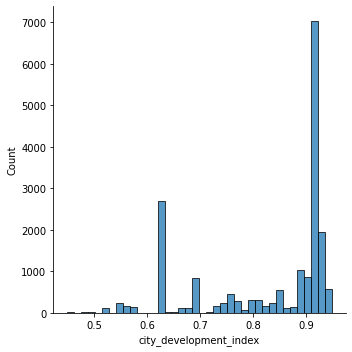

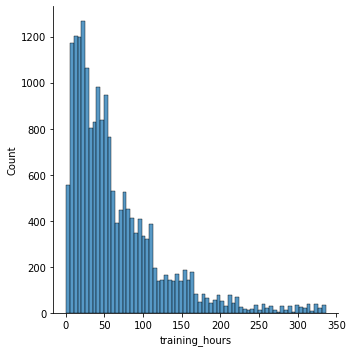

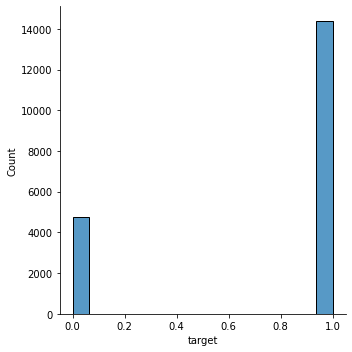

In [ ]:
#Checking data distributions

for i in ["city_development_index", "training_hours", "target"]:
    sns.displot(concated_df_h_2, x=i)

In [ ]:
#Target imbalance description:
concated_df_h_2["target"].value_counts()/concated_df_h_2["target"].count()

1.00   0.75
0.00   0.25
Name: target, dtype: float64

Text(0.5, 1.0, 'Correlation Heatmap of I')

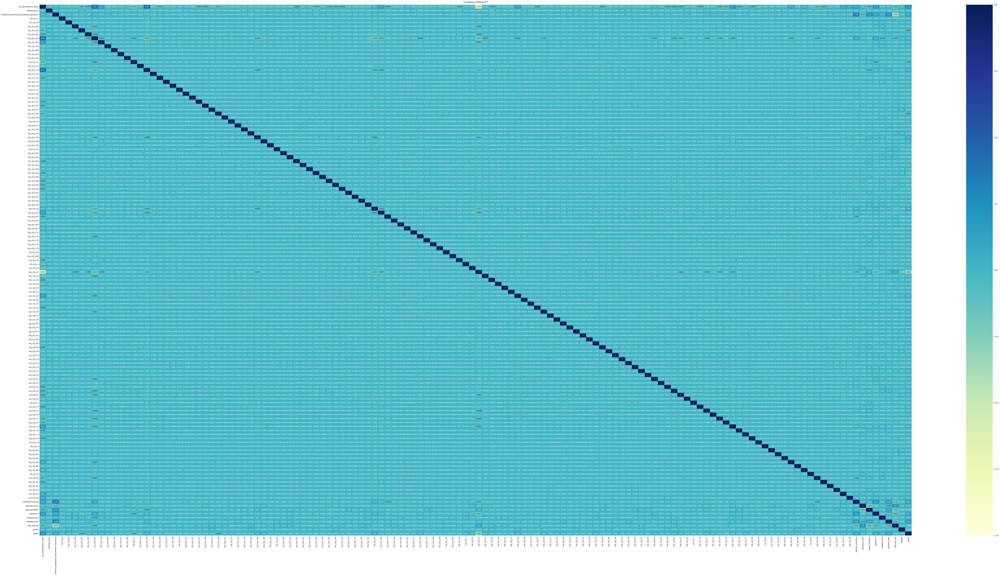

In [ ]:
#Checking correlation of data
#Source: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

plt.figure(figsize=(120, 60))

heatmap_h = sns.heatmap(concated_df_h_2.corr(method='spearman'), vmin=-1, vmax=1, annot=True, cmap="YlGnBu")

heatmap_h.set_title('Correlation Heatmap of I', fontdict={'fontsize':12}, pad=12)

In [ ]:
#Log scaling not normal feature data distributions

concated_df_h_2.loc[:,["city_development_index", "training_hours"]]+=1
concated_log_df_h = np.log(concated_df_h_2.loc[:,["city_development_index", "training_hours"]])
concated_df_h_2 = concated_df_h_2.drop(["city_development_index", "training_hours"], axis = 1)

In [ ]:
#Splitting data and Standardizing features

concated_df_h_2 = pd.concat([concated_log_df_h, concated_df_h_2], axis=1)
X_h = concated_df_h_2.iloc[:,:-1]
y_h = concated_df_h_2.iloc[:,-1]

X_train_h, X_valid_h, y_train_h, y_valid_h = train_test_split(X_h, y_h, test_size=0.33, random_state=0)

In [ ]:
#Preparing data for lazyprediction - (0.33 valid and 0.67 train)

clf_h = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models, predictions = clf_h.fit(X_train_h, X_valid_h, y_train_h, y_valid_h)

print(models)

100%|██████████| 29/29 [01:45<00:00,  3.64s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
NearestCentroid                    0.75               0.69     0.69      0.75   
BernoulliNB                        0.76               0.67     0.67      0.76   
LGBMClassifier                     0.77               0.66     0.66      0.76   
XGBClassifier                      0.77               0.66     0.66      0.76   
LinearDiscriminantAnalysis         0.77               0.65     0.65      0.76   
SVC                                0.78               0.65     0.65      0.76   
LinearSVC                          0.77               0.65     0.65      0.76   
RidgeClassifier                    0.77               0.64     0.64      0.75   
RidgeClassifierCV                  0.77               0.64     0.64      0.75   
LabelSpreading                     0.74               0.64     0.64      0.73   
LabelPropagation            

In [ ]:
###Setting seed

np.random.seed(0)

In [ ]:
###Training the model for clf (Tabnet) object

class F1_score(Metric):
    def __init__(self):
        self._name = "f1_score"
        self._maximize = True

    def __call__(self, y_true, y_score):
        y_score = np.where(y_score > 0.5, 1, 0)
        y_score = y_score[:,1]
        return f1_score(y_true, y_score, average="weighted")

n_total_train = len(X_h)

train_indices_h, valid_indices_h = train_test_split(range(n_total_train), test_size=0.33, random_state=0)


clf = TabNetClassifier(
    n_d=64, n_a=64, n_steps=5,
    gamma=1.5, n_independent=2, n_shared=2,
    cat_emb_dim=1,
    lambda_sparse=1e-4, momentum=0.3, clip_value=2.,
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    scheduler_params = {"gamma": 0.95,
                     "step_size": 20},
    scheduler_fn=torch.optim.lr_scheduler.StepLR, epsilon=1e-15
)

X_train_h_tb = X_h.values[train_indices_h]
y_train_h_tb = y_h.values[train_indices_h]

X_valid_h_tb = X_h.values[valid_indices_h]
y_valid_h_tb = y_h.values[valid_indices_h]

sc = StandardScaler()
X_train_h_tb = sc.fit_transform(X_train_h_tb)
X_valid_h_tb = sc.transform(X_valid_h_tb)

max_epochs = 100

clf.fit(
    X_train=X_train_h_tb, y_train=y_train_h_tb,
    eval_set=[(X_train_h_tb, y_train_h_tb), (X_valid_h_tb, y_valid_h_tb)],
    eval_name=['train', 'valid'],
    eval_metric=[F1_score],
    max_epochs=max_epochs, patience=100,
    batch_size=64, virtual_batch_size=64
)

Device used : cuda
epoch 0  | loss: 0.67448 | train_f1_score: 0.74343 | valid_f1_score: 0.7389  |  0:00:13s
epoch 1  | loss: 0.51082 | train_f1_score: 0.76103 | valid_f1_score: 0.75086 |  0:00:26s
epoch 2  | loss: 0.5046  | train_f1_score: 0.71677 | valid_f1_score: 0.71686 |  0:00:39s
epoch 3  | loss: 0.50135 | train_f1_score: 0.71865 | valid_f1_score: 0.71661 |  0:00:53s
epoch 4  | loss: 0.49056 | train_f1_score: 0.76433 | valid_f1_score: 0.75683 |  0:01:06s
epoch 5  | loss: 0.48448 | train_f1_score: 0.76886 | valid_f1_score: 0.75718 |  0:01:19s
epoch 6  | loss: 0.47533 | train_f1_score: 0.76905 | valid_f1_score: 0.75818 |  0:01:32s
epoch 7  | loss: 0.46985 | train_f1_score: 0.76879 | valid_f1_score: 0.75958 |  0:01:45s
epoch 8  | loss: 0.4706  | train_f1_score: 0.76916 | valid_f1_score: 0.75935 |  0:01:58s
epoch 9  | loss: 0.4845  | train_f1_score: 0.77265 | valid_f1_score: 0.76009 |  0:02:12s
epoch 10 | loss: 0.47639 | train_f1_score: 0.77061 | valid_f1_score: 0.76128 |  0:02:25s
ep